<a href="https://colab.research.google.com/github/jbzt/cancer_data_for_cluster_and_classification/blob/main/pan_cancer_clustering_with_links.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pre actividad
descargar los paquetes y datos necesarios para la actividad

In [1]:
# Este bloque funciona para cualquier persona que tenga el enlace a este notebook.

# Instalar y cargar la librería de googledrive
if (!requireNamespace("googledrive", quietly = TRUE)) {
  install.packages("googledrive")
}
library(googledrive)


dir.create("data.pancancer")

id_enlace_paquetes <- "https://drive.google.com/file/d/1Mx62CrFzAVKVa_18GMgBsDK0xMbguqJx/view?usp=sharing"

# pan cancer expression data
download.file("https://www.dropbox.com/scl/fi/zt2dsyfkohf07hvysq64n/pan_cancer_dataset.RDS?rlkey=tyql2pl7ehjtkd032afp0tf8q&st=ppf98tt8&dl=1", destfile = "data.pancancer/pan_cancer_dataset.RDS", mode = "wb")

# pan cancer labels
download.file("https://www.dropbox.com/scl/fi/l3qbpqhfp48m77cgg2gju/TCGA_phenotype_denseDataOnlyDownload.tsv?rlkey=2t1kzrimy5t7jcagdqsli4d2f&st=oc8s75rw&dl=1", destfile = "data.pancancer/labels.tsv", mode = "wb")

# pan cancer proteomics
download.file("https://www.dropbox.com/scl/fi/ebcjhxh6j2w5b8mrfzq64/RPPA_RBN.txt?rlkey=dhy3k3gjsai1ulzxwkshujx5b&st=34x4rhsk&dl=1", destfile = "data.pancancer/pan_cancer_proteomics.txt", mode = "wb")


# PASO 1: DESCARGAR TODO DESDE LOS ENLACES PÚBLICOS
cat("Descargando paquetes y datos. Esto puede tardar un momento...\n")

# Descargar paquetes
drive_download(as_id(id_enlace_paquetes), path = "R_packages_JB.zip", overwrite = TRUE)

# PASO 2: CONFIGURAR LOS PAQUETES (igual que antes)
unzip("R_packages_JB.zip")
.libPaths(new = c("R_libs_temp_JB", .libPaths()))


# PASO 3: CARGAR LAS LIBRERÍAS NECESARIAS PARA ESTE SCRIPT
library(tidyverse)
library(Rtsne)
library(plotly)
library(vegan)
library(cluster)
library(pheatmap)
library(stats)
library(caret)
library(ROCR)
library(ggfortify)
library(gtsummary)
library(glmnet)
library(xgboost)
library(mclust)
library(survival)
library(survminer)
library(readxl)

cat("Configuración completa. Todos los paquetes han sido cargados desde Google Drive.\n")

# --- FIN DEL BLOQUE DE CONFIGURACIÓN ESTÁNDAR ---


Warning message in dir.create("data.pancancer"):
“'data.pancancer' already exists”


Descargando paquetes y datos. Esto puede tardar un momento...


The googledrive package is requesting access to your Google account.
Enter '1' to start a new auth process or select a pre-authorized account.
1: Send me to the browser for a new auth process.
2: juanantoniobizzotto@gmail.com


Selection: 2


File downloaded:

• R_packages_JB.zip <id: 1Mx62CrFzAVKVa_18GMgBsDK0xMbguqJx>

Saved locally as:

• R_packages_JB.zip

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


Loading required package: permute

Loading required package: lattice


Attaching package: ‘caret’


The following obj

Configuración completa. Todos los paquetes han sido cargados desde Google Drive.


# opciones globales para los graficos

In [2]:
options(repr.plot.width = 14, repr.plot.height = 7)

# Introduction

This document presents a comprehensive workflow for the exploratory analysis of a pan-cancer dataset from The Cancer Genome Atlas (TCGA). The primary objective is to apply various unsupervised machine learning techniques, specifically clustering and dimensionality reduction, to identify patterns in high-dimensional molecular data (gene expression and proteomics). We will explore how these patterns correlate with clinical annotations, such as primary disease type and sample origin.

The analysis includes the following key steps:
1.  **Data Loading and Preparation**: Importing gene expression and proteomics data along with clinical labels.
2.  **Data Cleaning and Subsetting**: Preprocessing the data to handle missing values, duplicates, and reduce dimensionality for efficient analysis.
3.  **Exploratory Data Analysis (EDA)**: Utilizing dimensionality reduction techniques like Principal Component Analysis (PCA) and t-Distributed Stochastic Neighbor Embedding (t-SNE) to visualize the data structure.
4.  **Clustering Analysis**: Applying hierarchical clustering and other methods to group samples based on their molecular profiles.
5.  **Advanced Visualization**: Using interactive plots and annotated heatmaps to interpret the results in the context of clinical information.

This workflow serves as a foundational guide for researchers looking to perform similar large-scale analyses on multi-omics cancer data.

---

# 1. Environment Setup

Before starting the analysis, we need to install and load the necessary R packages. This initial step ensures that all required tools are available. The following code block defines a function to check for, install (if missing), and load each package.

---

# 2. Gene Expression Analysis (Transcriptomics)

In this section, we will analyze the pan-cancer gene expression dataset. A `README.md` file within the data directory provides essential information about the study.

## 2.1. Data Loading

We will load the pan-cancer gene expression data. The script is configured to either download the dataset from a remote source or load it from a local directory if it's already present.

In [3]:

local_path <- "data.pancancer/pan_cancer_dataset.RDS"
df <- readRDS(local_path)

## 2.2. Initial Data Inspection and Cleaning

First, we inspect the dimensions and structure of the dataset. We will then perform essential cleaning steps, such as checking for duplicate gene entries and setting the gene names as row identifiers for easier data manipulation.

In [4]:
# Display the dimensions (rows, columns) of the dataframe
dim(df)

# Show the top-left corner of the dataframe
head(df, n = c(4, 4))

# Verify that there are no duplicate gene names, which is crucial for indexing
any(duplicated(df$gene))

# Set the 'gene' column as the row names of the dataframe
row.names(df) <- df$gene
# Remove the original 'gene' column as it's now redundant
df <- df[-1]

# Display the top-left corner again to confirm the changes
head(df, n = c(4, 4))

[1] 20530 10460

,gene,TCGA-S9-A7J2-01,TCGA-G3-A3CH-11,TCGA-EK-A2RE-01
,<chr>,<dbl>,<dbl>,<dbl>
1,ARHGEF10L,10.9576,11.0186,9.7106
2,HIF3A,4.8099,5.3847,2.8888
3,RNF17,0.4657,0.0000,0.4192
4,RNF10,11.2675,11.6690,11.4903


[1] FALSE

,TCGA-S9-A7J2-01,TCGA-G3-A3CH-11,TCGA-EK-A2RE-01,TCGA-44-6778-01
,<dbl>,<dbl>,<dbl>,<dbl>
ARHGEF10L,10.9576,11.0186,9.7106,9.6205
HIF3A,4.8099,5.3847,2.8888,7.9642
RNF17,0.4657,0.0000,0.4192,1.5378
RNF10,11.2675,11.6690,11.4903,11.8432


## 2.3. Loading Clinical Annotations

Next, we load the clinical annotation data, which contains labels for each sample, including the primary disease and sample type (e.g., primary tumor, metastatic).

,sample,sample_type_id,sample_type,primary_disease
,<chr>,<int>,<chr>,<chr>
1,TCGA-D3-A1QA-07,7,Additional Metastatic,skin cutaneous melanoma
2,TCGA-DE-A4MD-06,6,Metastatic,thyroid carcinoma
3,TCGA-J8-A3O2-06,6,Metastatic,thyroid carcinoma
4,TCGA-J8-A3YH-06,6,Metastatic,thyroid carcinoma
5,TCGA-EM-A2P1-06,6,Metastatic,thyroid carcinoma
6,TCGA-J8-A4HW-06,6,Metastatic,thyroid carcinoma


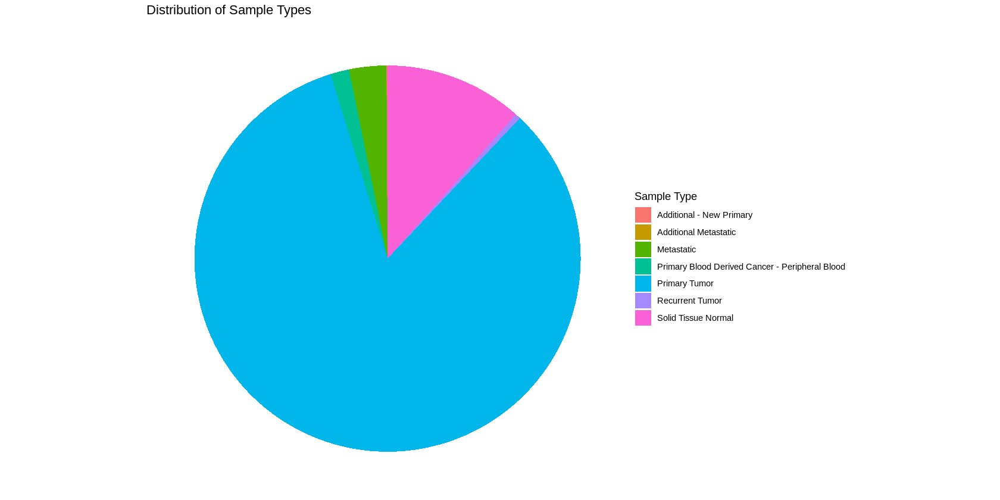

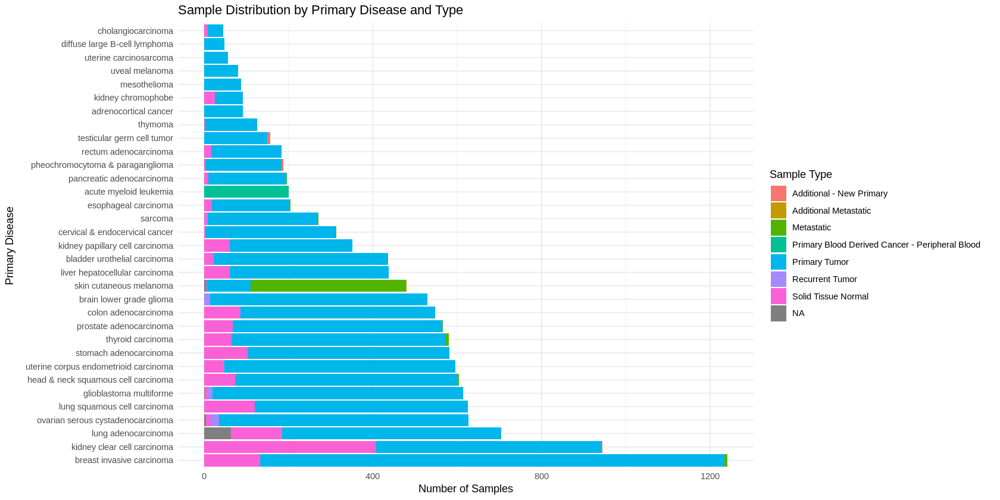

In [5]:
# Define the local path for the labels file
labels_path <- "data.pancancer/labels.tsv"

# Read the tab-separated file
labels <- read.delim(labels_path, sep = "\t", stringsAsFactors = FALSE, na.strings = "")

# Rename the fourth column to 'primary_disease' for clarity
colnames(labels)[4] <- "primary_disease"

# Display the first few rows of the labels dataframe
head(labels)

# --- Visualization of Sample Distribution ---

# Create a summary table of sample types
sample_type_counts <- as.data.frame(table(labels$sample_type))
colnames(sample_type_counts) <- c("sample_type", "count")

# Pie chart to show the distribution of different sample types
ggplot(sample_type_counts, aes(x = "", y = count, fill = sample_type)) +
  geom_bar(stat = "identity", width = 1) +
  coord_polar("y") +
  labs(title = "Distribution of Sample Types", fill = "Sample Type") +
  theme_void()

# Prepare data for a stacked bar chart showing sample types per primary disease
df_plot <- labels %>%
  count(primary_disease, sample_type) %>%
  group_by(primary_disease) %>%
  mutate(total = sum(n)) %>%
  ungroup() %>%
  arrange(desc(total)) %>%
  mutate(primary_disease = factor(primary_disease, levels = unique(primary_disease)))

# Stacked bar chart
ggplot(df_plot, aes(x = n, y = primary_disease, fill = sample_type)) +
  geom_bar(stat = "identity") +
  labs(
    title = "Sample Distribution by Primary Disease and Type",
    x = "Number of Samples",
    y = "Primary Disease",
    fill = "Sample Type"
  ) +
  theme_minimal()

## 2.4. Subsetting for Efficient Analysis

To manage the computational load, we will work with a randomly selected subset of genes and samples. This is a common practice for initial exploration and methodological testing.

In [6]:
# Set a seed for reproducibility of random sampling
set.seed(123)

# Define the number of genes and samples to subset
n.genes <- 200
n.samples <- 1000

# Randomly select indices for genes and samples
genes <- sample(x = 1:nrow(df), size = n.genes, replace = FALSE)
samples <- sample(x = 1:ncol(df), size = n.samples, replace = FALSE)

# Subset the main dataframe
df <- df[genes, samples]

# Transpose the dataframe. In machine learning, it's conventional to have
# observations (samples) as rows and features (genes) as columns.
df <- t(df)

# Display the head of the transposed and subsetted dataframe
head(df, n = c(4, 4))

,FTH1,BAHD1,LMTK2,RAB30
TCGA-CG-4477-01,15.0124,8.8056,10.2418,8.1482
TCGA-AB-2867-03,12.9641,9.7077,8.0310,5.7696
TCGA-B6-A0WV-01,15.1024,9.4204,9.2571,8.1054
TCGA-EL-A4K6-01,14.1450,10.5548,8.2570,3.4459


## 2.5. Aligning Annotation with Expression Data

It is critical to ensure that the clinical labels correspond to the samples in our expression matrix. We will align the `labels` dataframe with the subsetted `df` dataframe based on sample IDs (row names).

In [7]:
# Use sample IDs (now row names in 'df') to index and order the 'labels' dataframe
# First, set the 'sample' column as row names for 'labels' for direct mapping
rownames(labels) <- labels$sample
labels <- labels[rownames(df), ]

# Verify the dimensions to ensure they match
dim(labels)
dim(df)

# Check the head of the aligned labels
head(labels)

[1] 1000    4

[1] 1000  200

,sample,sample_type_id,sample_type,primary_disease
,<chr>,<int>,<chr>,<chr>
TCGA-CG-4477-01,TCGA-CG-4477-01,1,Primary Tumor,stomach adenocarcinoma
TCGA-AB-2867-03,TCGA-AB-2867-03,3,Primary Blood Derived Cancer - Peripheral Blood,acute myeloid leukemia
TCGA-B6-A0WV-01,TCGA-B6-A0WV-01,1,Primary Tumor,breast invasive carcinoma
TCGA-EL-A4K6-01,TCGA-EL-A4K6-01,1,Primary Tumor,thyroid carcinoma
TCGA-S8-A6BV-01,TCGA-S8-A6BV-01,1,Primary Tumor,esophageal carcinoma
TCGA-44-6148-01,TCGA-44-6148-01,1,Primary Tumor,lung adenocarcinoma


## 2.6. Dataset Summary

Let's review the number of samples available for each cancer type in our final subset.

In [8]:
# Count the number of observations for each primary disease and arrange in descending order
labels %>% count(primary_disease, name = "n.obs") %>% arrange(desc(n.obs))

primary_disease,n.obs
<chr>,<int>
breast invasive carcinoma,109
thyroid carcinoma,66
lung adenocarcinoma,63
brain lower grade glioma,57
prostate adenocarcinoma,56
lung squamous cell carcinoma,53
kidney clear cell carcinoma,52
head & neck squamous cell carcinoma,50
liver hepatocellular carcinoma,48


## 2.7. Dimensionality Reduction

We will now apply PCA and t-SNE to reduce the dimensionality of the gene expression data and visualize the relationships between samples.

### 2.7.1. Principal Component Analysis (PCA)

PCA is a linear technique that transforms the data into a new coordinate system of principal components (PCs), capturing the maximum variance.

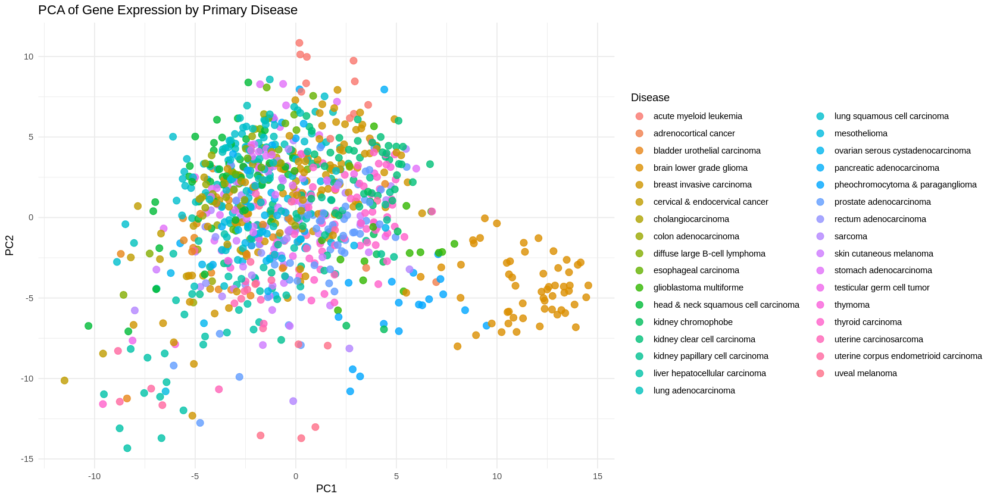

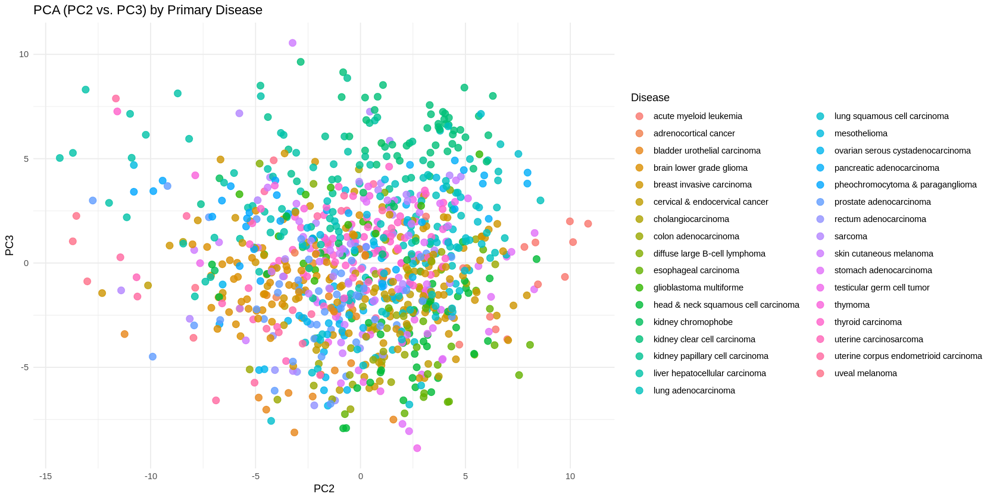

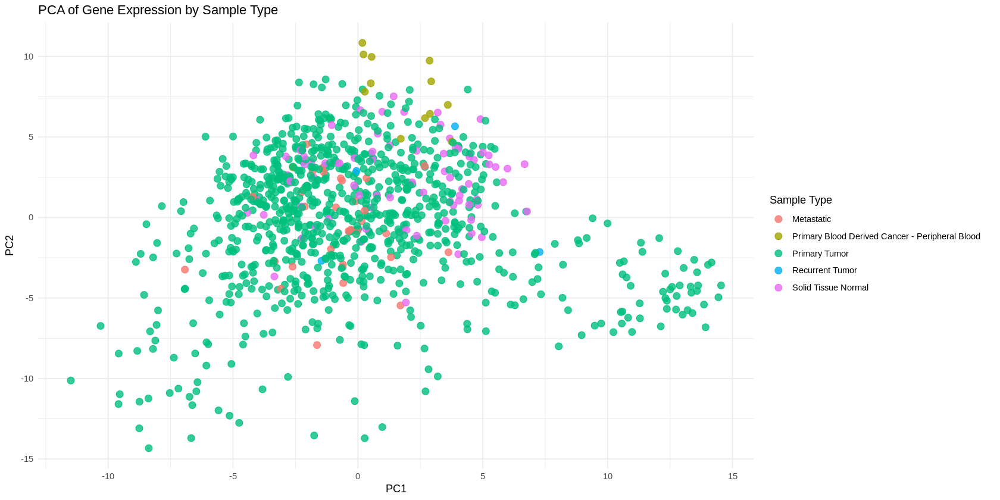

In [9]:
# Perform PCA on scaled and centered data.
# We filter out genes (columns) with zero total expression to avoid errors.
pca <- prcomp(df[, colSums(df) > 0], center = TRUE, scale. = TRUE)

# Create a dataframe with the first three PCs for visualization.
# It is common to start with PC1 and PC2, but other components can be insightful.
pca_df <- data.frame(pca$x[, 1:3], SampleID = rownames(pca$x))

# Add clinical annotations (primary disease and sample type) to the PCA results.
pca_df$disease <- labels[pca_df$SampleID, "primary_disease"]
pca_df$type <- labels[pca_df$SampleID, "sample_type"]

# Plot PC1 vs. PC2, colored by primary disease
ggplot(pca_df, aes(x = PC1, y = PC2, color = disease)) +
  geom_point(size = 3, alpha = 0.8) +
  theme_minimal() +
  labs(title = "PCA of Gene Expression by Primary Disease", color = "Disease")

# Plot PC2 vs. PC3 to explore other dimensions of variance
ggplot(pca_df, aes(x = PC2, y = PC3, color = disease)) +
  geom_point(size = 3, alpha = 0.8) +
  theme_minimal() +
  labs(title = "PCA (PC2 vs. PC3) by Primary Disease", color = "Disease")

# Plot PC1 vs. PC2, colored by sample type to see if it's a major source of variance
ggplot(pca_df, aes(x = PC1, y = PC2, color = type)) +
  geom_point(size = 3, alpha = 0.8) +
  theme_minimal() +
  labs(title = "PCA of Gene Expression by Sample Type", color = "Sample Type")

### 2.7.2. t-Distributed Stochastic Neighbor Embedding (t-SNE)

t-SNE is a non-linear technique particularly effective at visualizing high-dimensional data by preserving local structure, often revealing clusters that PCA might miss.

Performing PCA
Read the 1000 x 50 data matrix successfully!
OpenMP is working. 1 threads.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
Done in 0.20 seconds (sparsity = 0.125886)!
Learning embedding...
Iteration 50: error is 68.160560 (50 iterations in 0.21 seconds)
Iteration 100: error is 64.194878 (50 iterations in 0.14 seconds)
Iteration 150: error is 64.033048 (50 iterations in 0.13 seconds)
Iteration 200: error is 63.998660 (50 iterations in 0.14 seconds)
Iteration 250: error is 64.035676 (50 iterations in 0.15 seconds)
Iteration 300: error is 0.933217 (50 iterations in 0.15 seconds)
Iteration 350: error is 0.790390 (50 iterations in 0.13 seconds)
Iteration 400: error is 0.751338 (50 iterations in 0.13 seconds)
Iteration 450: error is 0.739711 (50 iterations in 0.13 seconds)
Iteration 500: error is 0.730013 (50 iterations in 0.13 seconds)
Iteration 550: error is 0.723624 (50 iterations in 0.13 seconds)
Iteration 60

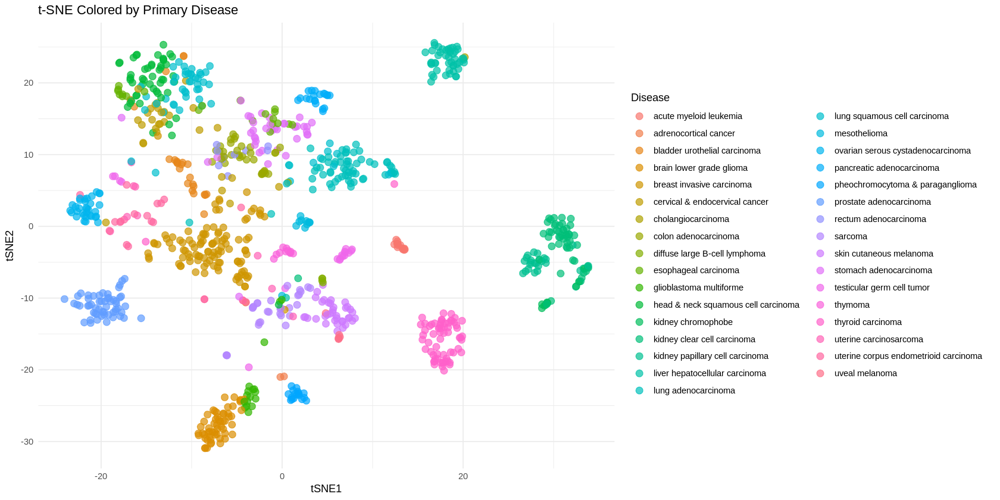

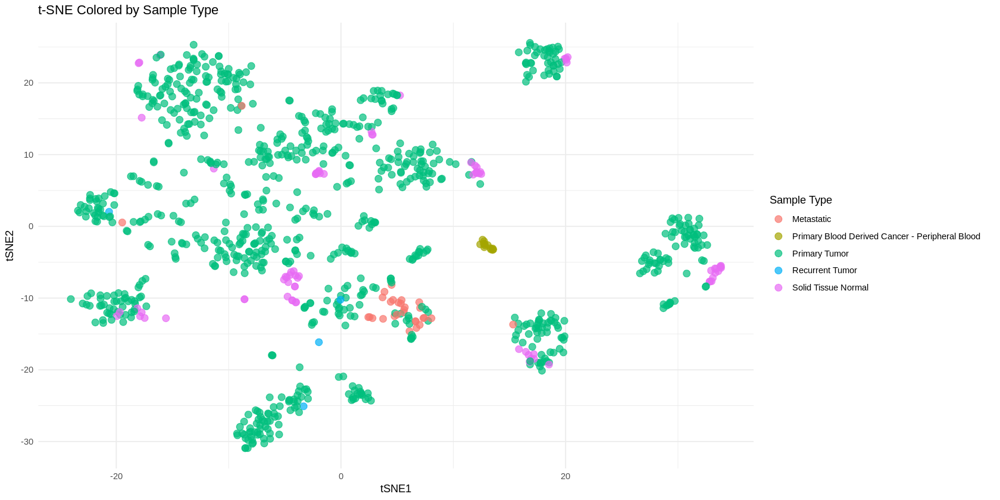

In [10]:
# Set a seed for reproducibility
set.seed(123)

# Run the Rtsne algorithm. Perplexity is a key parameter that balances local and global aspects.
# A typical range for perplexity is between 5 and 50.
tsne_out <- Rtsne(as.matrix(df), dims = 2, perplexity = 30, verbose = TRUE, max_iter = 1000)

# Create a dataframe with the t-SNE coordinates
tsne_df <- data.frame(tsne_out$Y)
colnames(tsne_df) <- c("tSNE1", "tSNE2")

# Add sample and clinical information for plotting
tsne_df$SampleID <- rownames(df)
tsne_df$disease <- labels[tsne_df$SampleID, "primary_disease"]
tsne_df$type <- labels[tsne_df$SampleID, "sample_type"]

# Plot t-SNE results, colored by primary disease
ggplot(tsne_df, aes(x = tSNE1, y = tSNE2, color = disease)) +
  geom_point(alpha = 0.7, size = 3) +
  theme_minimal() +
  labs(title = "t-SNE Colored by Primary Disease", color = "Disease")

# Plot t-SNE results, colored by sample type
ggplot(tsne_df, aes(x = tSNE1, y = tSNE2, color = type)) +
  geom_point(alpha = 0.7, size = 3) +
  theme_minimal() +
  labs(title = "t-SNE Colored by Sample Type", color = "Sample Type")

## 2.8. Advanced Visualization Strategies

When dealing with many categories, standard plots can become cluttered. Here are two strategies to enhance visualization.

### 2.8.1. Improving Legend Layout

For plots with numerous labels, moving the legend to the bottom and arranging it in multiple rows can provide more space for the plot itself.

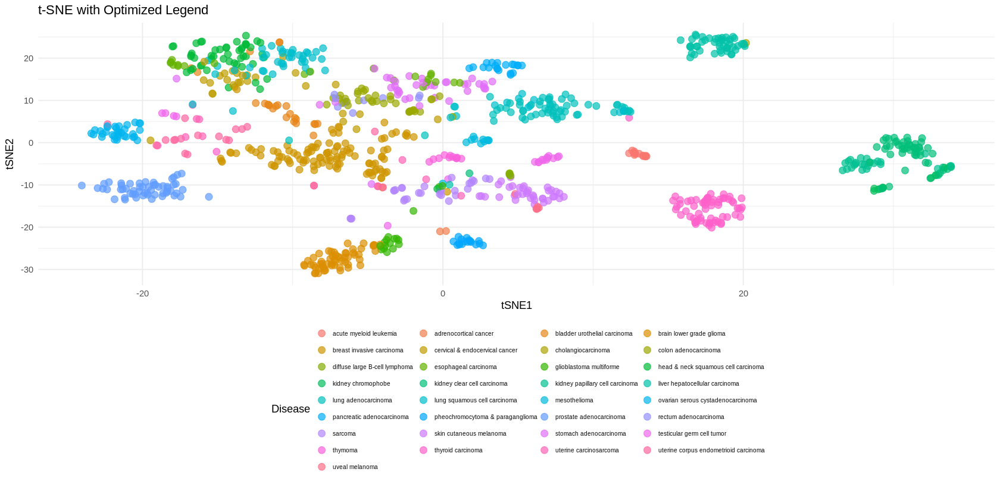

In [11]:
ggplot(tsne_df, aes(x = tSNE1, y = tSNE2, color = disease)) +
  geom_point(alpha = 0.7, size = 3) +
  theme_minimal() +
  labs(title = "t-SNE with Optimized Legend", color = "Disease") +
  theme(
    legend.position = "bottom",
    legend.direction = "horizontal",
    legend.text = element_text(size = 6),
    legend.key.size = unit(0.4, "cm")
  ) +
  guides(color = guide_legend(nrow = 10, byrow = TRUE))

### 2.8.2. Interactive Plots with Plotly

Converting a `ggplot` object to an interactive `plotly` graph allows users to hover over data points to see detailed information, which is invaluable for exploring complex visualizations.

In [12]:
# Create a ggplot object with a 'text' aesthetic for the tooltip information
p2 <- ggplot(tsne_df, aes(x = tSNE1, y = tSNE2, color = disease, text = paste("Sample:", SampleID, "<br>Disease:", disease))) +
  geom_point(alpha = 0.7, size = 3) +
  theme_minimal() +
  labs(title = "Interactive t-SNE Plot", color = "Disease")

# Convert the ggplot object to a plotly object
# The tooltip will display the information mapped to the 'text' aesthetic.
ggplotly(p2, tooltip = "text")

HTML widgets cannot be represented in plain text (need html)

## 2.9. Focused PCA on Selected Cancer Types

To improve interpretability, we can perform PCA on a smaller subset of cancer types. This can help reveal subtype-specific patterns that might be obscured in the pan-cancer analysis.

### 2.9.1. Random Subset of Cancer Types

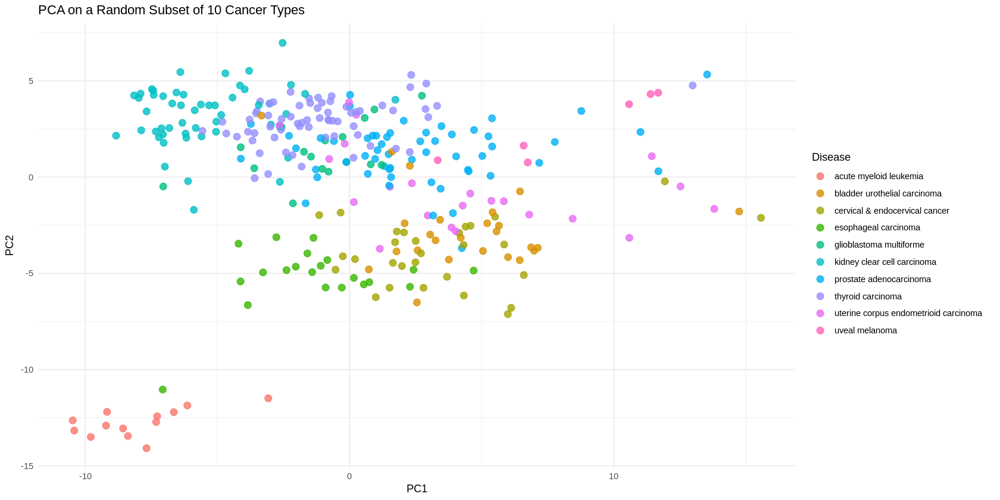

In [13]:
# Get a vector of unique disease types
diseases <- unique(labels$primary_disease)
n.labels <- 10 # Define the number of cancer types to select

# Randomly select cancer types
labels_to_keep <- diseases[sample(1:length(diseases), n.labels, replace = FALSE)]
# Get the sample IDs for the selected cancer types
samples_to_keep <- labels %>% filter(primary_disease %in% labels_to_keep) %>% rownames()

# Perform PCA on the subsetted data
# Note: We filter for columns with non-zero variance to prevent errors during scaling.
pca <- prcomp(as.data.frame(df[samples_to_keep,]) %>% select(where(~ var(.) != 0)),
              center = TRUE, scale. = TRUE)
pca_df <- data.frame(pca$x[, 1:2], SampleID = rownames(pca$x))
pca_df$disease <- labels[pca_df$SampleID, "primary_disease"]

# Plot the focused PCA
ggplot(pca_df, aes(x = PC1, y = PC2, color = disease)) +
  geom_point(size = 3, alpha = 0.8) +
  theme_minimal() +
  labs(title = "PCA on a Random Subset of 10 Cancer Types", color = "Disease")

### 2.9.2. User-Defined Subset of Cancer Types

 [1] "acute myeloid leukemia"               
 [2] "adrenocortical cancer"                
 [3] "bladder urothelial carcinoma"         
 [4] "brain lower grade glioma"             
 [5] "breast invasive carcinoma"            
 [6] "cervical & endocervical cancer"       
 [7] "cholangiocarcinoma"                   
 [8] "colon adenocarcinoma"                 
 [9] "diffuse large B-cell lymphoma"        
[10] "esophageal carcinoma"                 
[11] "glioblastoma multiforme"              
[12] "head & neck squamous cell carcinoma"  
[13] "kidney chromophobe"                   
[14] "kidney clear cell carcinoma"          
[15] "kidney papillary cell carcinoma"      
[16] "liver hepatocellular carcinoma"       
[17] "lung adenocarcinoma"                  
[18] "lung squamous cell carcinoma"         
[19] "mesothelioma"                         
[20] "ovarian serous cystadenocarcinoma"    
[21] "pancreatic adenocarcinoma"            
[22] "pheochromocytoma & paraganglioma"     
[23] "pros

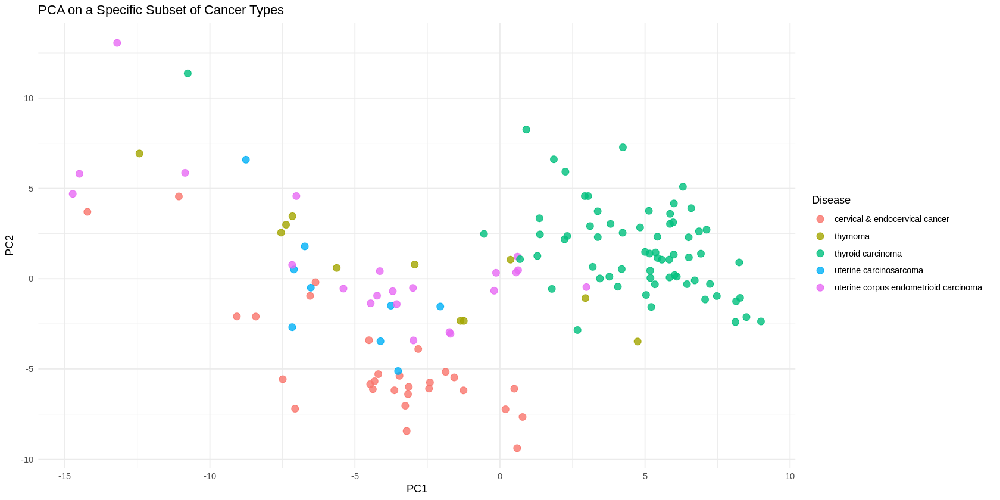

In [14]:
# View available labels to make an informed choice
print(sort(unique(labels$primary_disease)))

# Define a specific list of cancer types of interest
labels_to_keep <- c("thymoma", "thyroid carcinoma", "uterine carcinosarcoma",
                    "uterine corpus endometrioid carcinoma", "cervical & endocervical cancer")
samples_to_keep <- labels %>% filter(primary_disease %in% labels_to_keep) %>% rownames()

# Perform PCA on the specified subset
library(stats)

pca <- prcomp(as.data.frame(df[samples_to_keep,]) %>%
    select(all_of(colnames(.)[colSums(.) > 0 & apply(as.matrix(.), 2, var) != 0])),
    center = TRUE, scale. = TRUE)
pca_df <- data.frame(pca$x[, 1:2], SampleID = rownames(pca$x))
pca_df$disease <- labels[pca_df$SampleID, "primary_disease"]

# Plot the focused PCA
ggplot(pca_df, aes(x = PC1, y = PC2, color = disease)) +
  geom_point(size = 3, alpha = 0.8) +
  theme_minimal() +
  labs(title = "PCA on a Specific Subset of Cancer Types", color = "Disease")

## 2.10. Distance-Based Analyses

Here we compute dissimilarity matrices and use them for clustering and ordination.

### 2.10.1. Distance Matrix Computation

We will calculate different distance metrics to explore sample relationships.
* **Euclidean**: Standard distance in geometric space. Sensitive to magnitude.
* **Bray-Curtis**: Based on abundance data, sensitive to composition.
* **Jaccard**: Based on presence/absence, measures dissimilarity in community composition.

In [15]:
# Euclidean distance on the original data
dist_euc <- dist(df, method = "euclidean")

# Bray-Curtis dissimilarity, a popular metric in ecology for composition
dist_bray <- vegdist(df, method = "bray")

# Jaccard dissimilarity on binarized data (presence/absence of expression)
dist_jacc <- vegdist(df > 0, method = "jaccard")

### 2.10.2. Hierarchical Clustering and Heatmap

Hierarchical clustering builds a tree-like structure (dendrogram) of samples based on their similarity. We visualize the clustering result alongside a heatmap of the expression data.

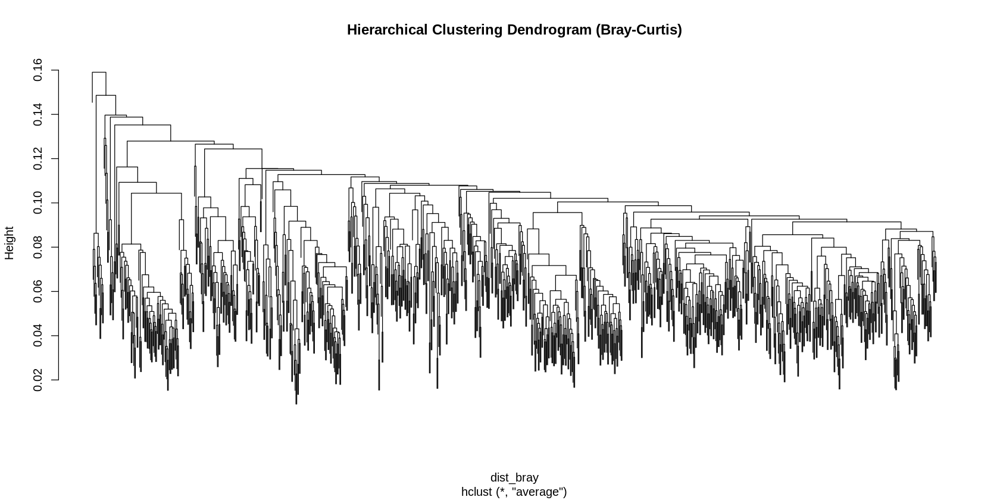

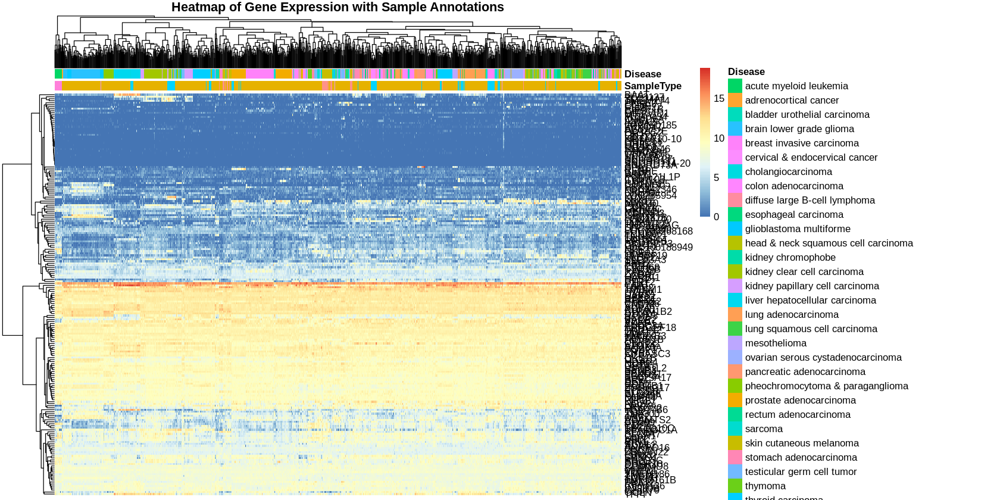

In [16]:
# Perform hierarchical clustering using the Bray-Curtis dissimilarity and average linkage
hc <- hclust(dist_bray, method = "average")
plot(hc, labels = FALSE, main = "Hierarchical Clustering Dendrogram (Bray-Curtis)")

# Create an annotation dataframe for the heatmap columns (our samples)
samples <- rownames(df)
annotation_col <- data.frame(
  SampleType = labels[samples, "sample_type"],
  Disease = labels[samples, "primary_disease"]
)
rownames(annotation_col) <- samples

# Generate the heatmap
# We cluster columns (samples) based on our hierarchical clustering result (hc).
# We also cluster rows (genes) using the default pheatmap clustering.
# Column names are hidden for clarity, but annotations are shown.
pheatmap(as.matrix(t(df)),
         cluster_rows = TRUE,
         cluster_cols = TRUE,
         show_rownames = TRUE, # Show gene names
         show_colnames = FALSE, # Hide sample names
         annotation_col = annotation_col,
         main = "Heatmap of Gene Expression with Sample Annotations")

### 2.10.3. Non-metric Multidimensional Scaling (NMDS)

NMDS is an ordination technique that represents the dissimilarities between samples in a low-dimensional space, attempting to preserve the rank order of distances.

Wisconsin double standardization
Run 0 stress 0.2291456 
Run 1 stress 0.2406132 
Run 2 stress 0.2306706 
Run 3 stress 0.2293619 
... Procrustes: rmse 0.003155317  max resid 0.05115116 
Run 4 stress 0.2395823 
Run 5 stress 0.2358671 
Run 6 stress 0.2302154 
Run 7 stress 0.229504 
... Procrustes: rmse 0.003219138  max resid 0.09195476 
Run 8 stress 0.2301168 
Run 9 stress 0.2304028 
Run 10 stress 0.2341564 
*** Best solution was not repeated -- monoMDS stopping criteria:
     7: no. of iterations >= maxit
     1: stress ratio > sratmax
     2: scale factor of the gradient < sfgrmin


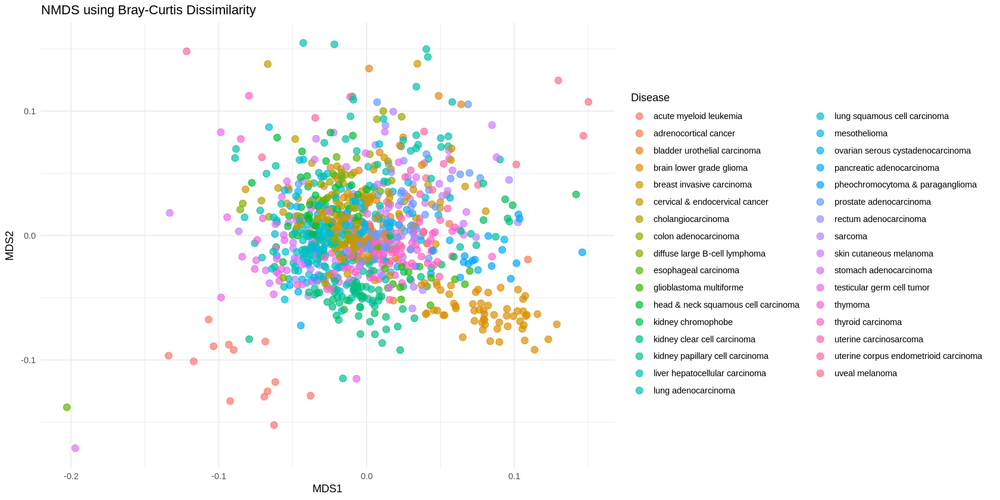

In [17]:
# Perform NMDS using Bray-Curtis distance, aiming for a 2-dimensional solution.
# 'trymax' specifies the number of random starts to find a stable solution.
nmds <- metaMDS(df, distance = "bray", k = 2, trymax = 10)

# Extract the NMDS coordinates into a dataframe for plotting
nmds_df <- as.data.frame(nmds$points)
nmds_df$SampleID <- rownames(nmds_df)
nmds_df$disease <- labels[nmds_df$SampleID, "primary_disease"]

# Plot the NMDS results
ggplot(nmds_df, aes(x = MDS1, y = MDS2, color = disease)) +
  geom_point(alpha = 0.7, size = 3) +
  theme_minimal() +
  labs(title = "NMDS using Bray-Curtis Dissimilarity", color = "Disease")

---

# 3. Proteomics Analysis

In this section, we will perform a similar exploratory analysis on a proteomics dataset generated using Reverse Phase Protein Array (RPPA) technology.

## 3.1. Data Loading and Preparation

We load the proteomics data and the same clinical labels, then align them to ensure sample correspondence.

In [18]:
# Define file path for proteomics data
proteomics_path <- "data.pancancer/pan_cancer_proteomics.txt"

# Load the proteomics data
proteomics <- read.delim(proteomics_path, row.names = 1, check.names = FALSE)

# Transpose the data so that samples are rows and proteins are columns
df.proteomics <- t(proteomics)

# Reload the full labels file to ensure we can match all possible samples
labels_full <- read.delim("data.pancancer/labels.tsv", sep = "\t", stringsAsFactors = FALSE, na.strings = "")
colnames(labels_full)[4] <- "primary_disease"
rownames(labels_full) <- labels_full$sample

# Find the common samples between the proteomics data and the labels
common_samples <- intersect(rownames(df.proteomics), rownames(labels_full))

# Subset both the data and labels to include only the common samples
df.proteomics <- df.proteomics[common_samples, ]
labels.proteomics <- labels_full[common_samples, ]

# Verify the final dimensions
dim(df.proteomics)
dim(labels.proteomics)

[1] 3454  131

[1] 3454    4

## 3.2. Dimensionality Reduction for Proteomics

We will now apply PCA and t-SNE to the proteomics data.

### 3.2.1. PCA on Proteomics Data

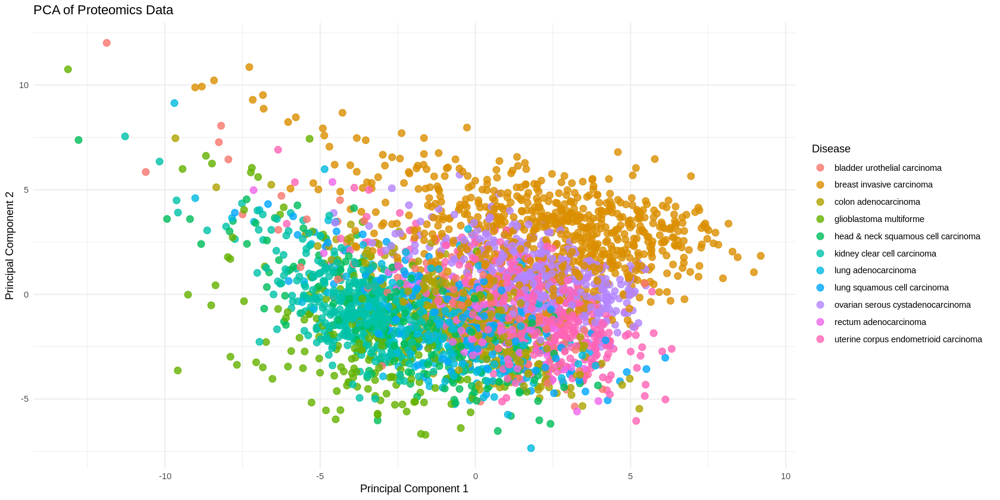

In [19]:
# Perform PCA on scaled and centered data, removing zero-expression proteins
pca_prot <- prcomp(df.proteomics[, colSums(df.proteomics, na.rm=T) > 0], center = TRUE, scale. = TRUE)

# Create a dataframe for plotting
pca_prot_df <- data.frame(pca_prot$x[, 1:2])
pca_prot_df$SampleID <- rownames(pca_prot_df)

# Add clinical annotations
pca_prot_df$type <- labels.proteomics[pca_prot_df$SampleID, "sample_type"]
pca_prot_df$disease <- labels.proteomics[pca_prot_df$SampleID, "primary_disease"]

# Plot PCA results, colored by primary disease
ggplot(pca_prot_df, aes(x = PC1, y = PC2, color = disease)) +
  geom_point(size = 3, alpha = 0.8) +
  labs(title = "PCA of Proteomics Data", x = "Principal Component 1", y = "Principal Component 2", color = "Disease") +
  theme_minimal()

### 3.2.2. t-SNE on Proteomics Data

Performing PCA
Read the 3454 x 50 data matrix successfully!
OpenMP is working. 1 threads.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
Done in 1.48 seconds (sparsity = 0.038910)!
Learning embedding...
Iteration 50: error is 83.309106 (50 iterations in 0.71 seconds)
Iteration 100: error is 74.175377 (50 iterations in 0.69 seconds)
Iteration 150: error is 73.597823 (50 iterations in 0.67 seconds)
Iteration 200: error is 73.523349 (50 iterations in 0.71 seconds)
Iteration 250: error is 73.522210 (50 iterations in 0.71 seconds)
Iteration 300: error is 2.156998 (50 iterations in 0.56 seconds)
Iteration 350: error is 1.888710 (50 iterations in 0.55 seconds)
Iteration 400: error is 1.767048 (50 iterations in 0.56 seconds)
Iteration 450: error is 1.702766 (50 iterations in 0.54 seconds)
Iteration 500: error is 1.668562 (50 iterations in 0.69 seconds)
Iteration 550: error is 1.653064 (50 iterations in 0.81 seconds)
Iteration 60

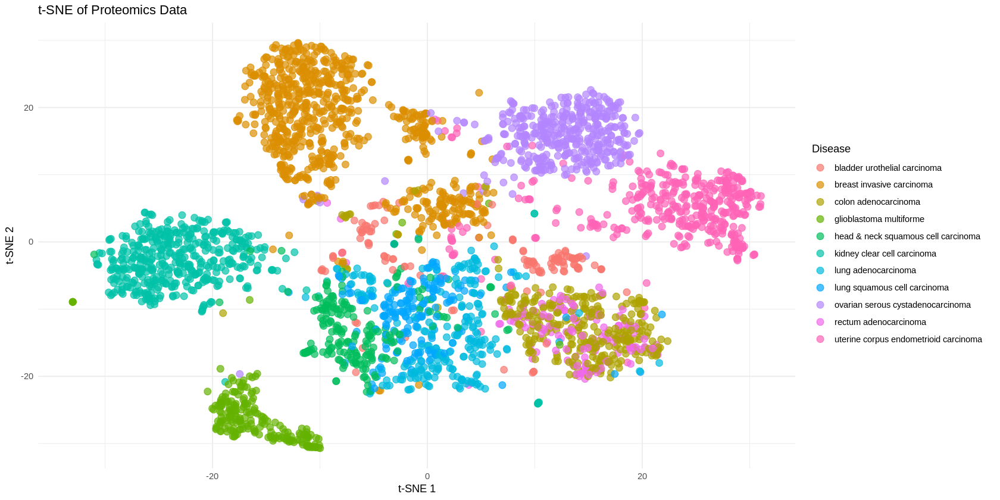

In [20]:
# Set seed for reproducibility
set.seed(123)
# Run t-SNE
tsne_prot_out <- Rtsne(as.matrix(df.proteomics[, colSums(df.proteomics, na.rm=T) > 0]),
                       dims = 2, perplexity = 30, verbose = TRUE, max_iter = 1000)

# Create a dataframe for plotting
tsne_prot_df <- as.data.frame(tsne_prot_out$Y)
colnames(tsne_prot_df) <- c("tSNE1", "tSNE2")
tsne_prot_df$SampleID <- rownames(df.proteomics)

# Add clinical annotations
tsne_prot_df$disease <- labels.proteomics[tsne_prot_df$SampleID, "primary_disease"]

# Plot t-SNE results
ggplot(tsne_prot_df, aes(x = tSNE1, y = tSNE2, color = disease)) +
  geom_point(alpha = 0.7, size = 3) +
  labs(title = "t-SNE of Proteomics Data", x = "t-SNE 1", y = "t-SNE 2", color = "Disease") +
  theme_minimal()